1. Training&validation images and annotations:
  - driver_23_30frame.tar.gz
  - driver_161_90frame.tar.gz
  - driver_182_30frame.tar.gz

*For each image, there would be a .txt annotation file, in which each line gives the x,y coordinates for key points of a lane marking.

2. Testing images and annotations:
  - driver_37_30frame.tar.gz
  - driver_100_30frame.tar.gz
  - driver_193_90frame.tar.gz


#### Due to resource limitations the only dataset used was:
driver_161_90frame.tar.gz

#### Final Models weights have been saved to :
https://drive.google.com/drive/folders/1yjOHsrlxCWGmj4WwngteYrtCA6wcE2-1?usp=sharing

In [1]:
import matplotlib.pyplot as plt
from numpy import argmax, array_equal
from random import randint
import pandas as pd
import numpy as np
import cv2
import os
import tensorflow as tf

# PreProcessing 

### Loading Data from TarFile

In [1]:
# import tarfile

# # Open the file.
# tfile = tarfile.open("data/driver_161_90frame.tar.gz")
# tfile.extractall(path="data/extracted/")

In [2]:
# tfile = tarfile.open("data/driver_182_30frame.tar.gz")
# tfile.extractall(path="data/extracted/")

In [3]:
# tfile = tarfile.open("data/driver_23_30frame.tar.gz")
# tfile.extractall(path="data/extracted/")

In [8]:
names = tfile.getnames()

In [12]:
sorted(names)

['driver_161_90frame',
 'driver_161_90frame/06030819_0755.MP4',
 'driver_161_90frame/06030819_0755.MP4/00000.jpg',
 'driver_161_90frame/06030819_0755.MP4/00000.lines.txt',
 'driver_161_90frame/06030819_0755.MP4/00090.jpg',
 'driver_161_90frame/06030819_0755.MP4/00090.lines.txt',
 'driver_161_90frame/06030819_0755.MP4/00180.jpg',
 'driver_161_90frame/06030819_0755.MP4/00180.lines.txt',
 'driver_161_90frame/06030819_0755.MP4/00270.jpg',
 'driver_161_90frame/06030819_0755.MP4/00270.lines.txt',
 'driver_161_90frame/06030819_0755.MP4/00360.jpg',
 'driver_161_90frame/06030819_0755.MP4/00360.lines.txt',
 'driver_161_90frame/06030819_0755.MP4/00450.jpg',
 'driver_161_90frame/06030819_0755.MP4/00450.lines.txt',
 'driver_161_90frame/06030819_0755.MP4/00540.jpg',
 'driver_161_90frame/06030819_0755.MP4/00540.lines.txt',
 'driver_161_90frame/06030819_0755.MP4/00630.jpg',
 'driver_161_90frame/06030819_0755.MP4/00630.lines.txt',
 'driver_161_90frame/06030819_0755.MP4/00720.jpg',
 'driver_161_90frame/

In [151]:
names[2::2]

['driver_161_90frame/06030819_0755.MP4/00000.jpg',
 'driver_161_90frame/06030819_0755.MP4/00090.jpg',
 'driver_161_90frame/06030819_0755.MP4/00180.jpg',
 'driver_161_90frame/06030819_0755.MP4/00270.jpg',
 'driver_161_90frame/06030819_0755.MP4/00360.jpg',
 'driver_161_90frame/06030819_0755.MP4/00450.jpg',
 'driver_161_90frame/06030819_0755.MP4/00540.jpg',
 'driver_161_90frame/06030819_0755.MP4/00630.jpg',
 'driver_161_90frame/06030819_0755.MP4/00720.jpg',
 'driver_161_90frame/06030819_0755.MP4/00810.jpg',
 'driver_161_90frame/06030819_0755.MP4/00900.jpg',
 'driver_161_90frame/06030819_0755.MP4/00990.jpg',
 'driver_161_90frame/06030819_0755.MP4/01080.jpg',
 'driver_161_90frame/06030819_0755.MP4/01170.jpg',
 'driver_161_90frame/06030819_0755.MP4/01260.jpg',
 'driver_161_90frame/06030819_0755.MP4/01350.jpg',
 'driver_161_90frame/06030819_0755.MP4/01440.jpg',
 'driver_161_90frame/06030819_0755.MP4/01530.jpg',
 'driver_161_90frame/06030819_0755.MP4/01620.jpg',
 'driver_161_90frame/06030819_0

In [ ]:
img_names = 

In [19]:
tfile.extractall(path="data/extracted/")

In [5]:
# img0 = cv2.imread(("data/extracted/driver_161_90frame/06030819_0755.MP4/00000.jpg"))
# cv2.imshow(img0)

In [3]:
img0 = cv2.imread(("data/extracted/driver_161_90frame/06030819_0755.MP4/00000.jpg"))
multiplier = 3
width = 164*multiplier
height = 59*multiplier
channel = 3
dsize = (width, height)
img_resized = cv2.resize(np.array(img0), dsize)
img_resized.shape
# x, y = annotate_extract("/driver_161_90frame/06030819_0755.MP4/00000.jpg")

(177, 492, 3)

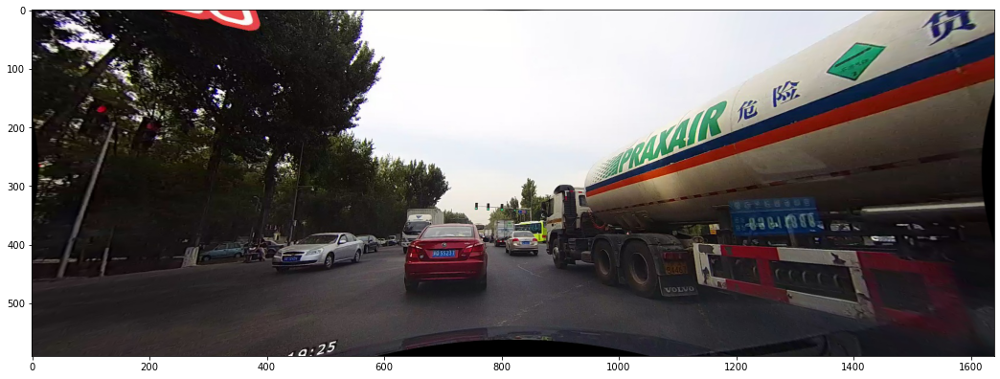

In [2]:
img0 = cv2.imread(("data/extracted/driver_161_90frame/06030819_0755.MP4/00000.jpg"))

fig, ax = plt.subplots(figsize=(18, 20))

ax.imshow(cv2.cvtColor(img0, cv2.COLOR_BGR2RGB))

In [124]:
xy

['362.966 590 380.01 580 398.561 570 417.995 560 436.546 550 455.097 540 474.531 530 492.693 520 512.127 510 530.678 500 549.229 490 568.663 480 587.214 470 605.688 460 625.123 450 643.673 440 662.224 430 681.659 420 700.21 410 ',
 '774.238 590 774.238 580 774.238 570 774.238 560 774.238 550 774.238 540 774.238 530 774.238 520 774.238 510 774.238 500 774.238 490 774.238 480 774.238 470 774.238 460 774.238 450 774.238 440 774.238 430 774.238 420 774.238 410 ',
 '1170.53 590 1154.59 580 1136.2 570 1117.8 560 1099.41 550 1081.88 540 1063.49 530 1045.28 520 1026.88 510 1008.49 500 990.967 490 972.571 480 954.176 470 936.5 460 918.105 450 899.709 440 882.189 430 863.793 420 845.396 410 ',
 '1656.51 510 1593.56 500 1529.36 490 1466.14 480 1402.92 470 1339.09 460 1275.88 450 1212.66 440 1149.44 430 1086.22 420 1023 410 ',
 '']

### Extracting Lane Annotations from Datset

In [122]:
def annotate_extract(url):
    txt1 = open(f"data/extracted/{url}", 'r')
    xy = txt1.read().split('\n')
    x_y = []
    for i in xy:
        for j in i.split():
            x_y.append(float(j))
    return x_y[::2], x_y[1::2]

In [127]:
len(x_y)

136

### Function that shows images with Lanes

In [120]:
def test_show_lanes(url, return_img= None, b_w=None):
    x, y = annotate_extract(url[:-3]+("lines.txt"))
    if b_w == True:
        img0 = cv2.imread((f"data/extracted/{url}"),0)
    if b_w == False:
        img0 = cv2.imread((f"data/extracted/{url}"))
    else:   
        img0 = cv2.imread((f"data/extracted/{url}"))
        
    if return_img == True:
        df1 = pd.DataFrame(np.array([np.array(x).astype(int), np.array(y).astype(int)]).T)
        arr = df1.to_numpy()
        img = copy.deepcopy(img0)

        #loop through each coordinate pair in arr
        for item in arr:
            cv2.drawMarker(img0, (item[0], item[1]),(0,255,0), markerType=cv2.MARKER_CROSS , 
            markerSize=11, thickness=2, line_type=cv2.LINE_AA)
#         image = cv2.circle(img0, (x,y), radius=0, color=(0, 0, 255), thickness=-1)
        return img,img0
    else:
        fig, ax = plt.subplots(figsize=(18, 20))
        ax.scatter(x, y)
        ax.imshow(cv2.cvtColor(img0, cv2.COLOR_BGR2RGB))

In [23]:
# img0 = cv2.imread(("data/extracted/{url}"))
# fig, ax = plt.subplots(figsize=(18, 20))
# ax.scatter(x, y)
# ax.imshow(cv2.cvtColor(img0, cv2.COLOR_BGR2RGB))

In [165]:
os.getcwd()

'G:\\Desktop\\IIT_ML_AI\\Capstone Projects\\Self Driving Car'

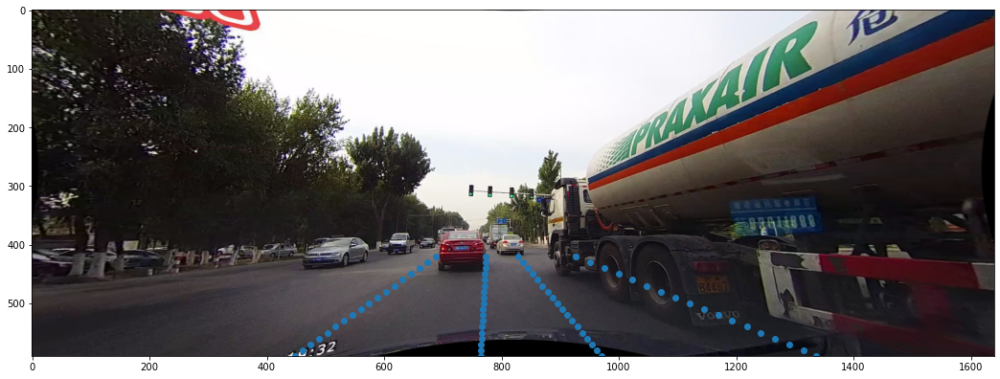

In [133]:
num = 90*2
test_show_lanes(f'driver_161_90frame/06030819_0755.MP4/00180.jpg')

### Test Cell to run a video with Lanes drawn

In [124]:
fps = 20
title = 'normal speed video'
delay = int(1000 / fps)

import copy
while True:
    try:
        for folder in os.listdir(os.getcwd()+"\\data\\extracted\\driver_161_90frame"):
            frames = os.listdir(os.getcwd()+f"\\data\\extracted\\driver_161_90frame\\{folder}")[::2]
            for img in frames:
                _,frame = test_show_lanes(f'driver_161_90frame/{folder}/{img}', return_img=True, b_w=False)
                cv2.imshow(title, frame)

                if cv2.waitKey(delay) & 0xFF == ord('q'):
                    break

    except KeyboardInterrupt:
        break


cv2.destroyAllWindows()

##---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------##
##---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------##

In [9]:
from keras.layers import Dense, Input, Conv2D, LSTM, MaxPool2D, UpSampling2D
from sklearn.model_selection import train_test_split
from keras.callbacks import EarlyStopping
from keras.utils import to_categorical
from keras.models import Model
# from imgaug import augmenters

In [2]:
import os
path = os.getcwd()+"\data\extracted\driver_161_90frame\\06030819_0755.MP4"
print(path)

G:\Desktop\IIT_ML_AI\Capstone Projects\Self Driving Car\data\extracted\driver_161_90frame\06030819_0755.MP4


In [34]:
os.listdir(path=path)

['00000.jpg',
 '00000.lines.txt',
 '00090.jpg',
 '00090.lines.txt',
 '00180.jpg',
 '00180.lines.txt',
 '00270.jpg',
 '00270.lines.txt',
 '00360.jpg',
 '00360.lines.txt',
 '00450.jpg',
 '00450.lines.txt',
 '00540.jpg',
 '00540.lines.txt',
 '00630.jpg',
 '00630.lines.txt',
 '00720.jpg',
 '00720.lines.txt',
 '00810.jpg',
 '00810.lines.txt',
 '00900.jpg',
 '00900.lines.txt',
 '00990.jpg',
 '00990.lines.txt',
 '01080.jpg',
 '01080.lines.txt',
 '01170.jpg',
 '01170.lines.txt',
 '01260.jpg',
 '01260.lines.txt',
 '01350.jpg',
 '01350.lines.txt',
 '01440.jpg',
 '01440.lines.txt',
 '01530.jpg',
 '01530.lines.txt',
 '01620.jpg',
 '01620.lines.txt',
 '01710.jpg',
 '01710.lines.txt',
 '01800.jpg',
 '01800.lines.txt',
 '01890.jpg',
 '01890.lines.txt',
 '01980.jpg',
 '01980.lines.txt',
 '02070.jpg',
 '02070.lines.txt',
 '02160.jpg',
 '02160.lines.txt',
 '02250.jpg',
 '02250.lines.txt',
 '02340.jpg',
 '02340.lines.txt',
 '02430.jpg',
 '02430.lines.txt',
 '02520.jpg',
 '02520.lines.txt',
 '02610.jpg',


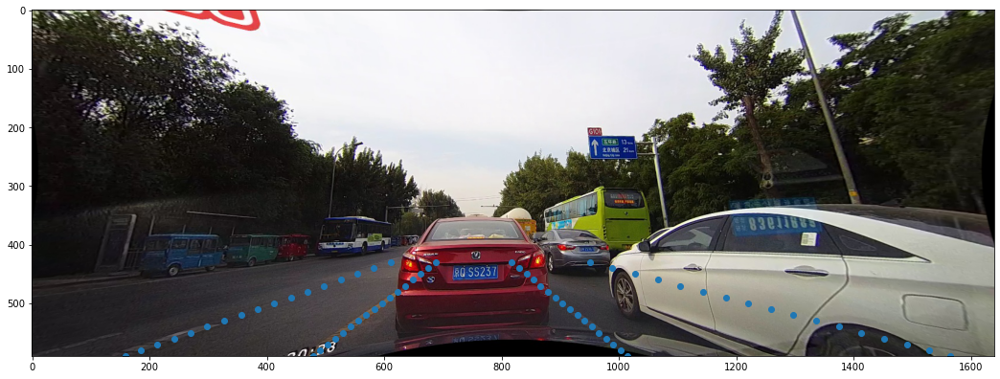

In [51]:
test_show_lanes('driver_161_90frame\\06030819_0755.MP4\\01890.jpg')

### Convert Both Images and Lanes Coorinate Information to Arrays and save to .npy File

In [4]:
def lane_image_data(url):
    x, y = annotate_extract(url[:-3]+("lines.txt"))
    img0 = cv2.imread((f"data/extracted/{url}"),0)
    return img0

In [5]:
def annotation(url):
    txt1 = open(url, 'r')
    xy = txt1.read().split('\n')
    x_y = []
    for i in xy:
        for j in i.split():
            x_y.append(float(j))
    return x_y[::2], x_y[1::2]

In [ ]:
import os
x_train_data = []
y_train_data = []

cwd = os.getcwd()+"\data\extracted\driver_161_90frame"
# cwd = os.getcwd()+"\data\extracted\driver_23_30frame"


pp_x = os.getcwd()+"\data\extracted\X_train_161_90_org.npy"
pp_y = os.getcwd()+"\data\extracted\y_train_161_90_org.npy"
print(pp_x, pp_y)

list_folders = (os.listdir(path=cwd))
for folder in list_folders[:-64]:
    path = cwd+f"\\{folder}"
    sub_folder = os.listdir(path)[0::2]
    i = 0
    for img in sub_folder:
        i = i+1
        path1 = path +f"\\{img}"
        x_train_data.append(cv2.imread(path1,0))
        y_train_data.append((annotation(path1[:-3]+("lines.txt"))))
        if (len(x_train_data) %60 ==0):
            np.save(pp_x, np.array(x_train_data))
            np.save(pp_y, np.array(y_train_data))
            
    print(f"{folder} Converted & Saved : {i} images.")

G:\Desktop\IIT_ML_AI\Capstone Projects\Self Driving Car\data\extracted\X_train_161_90_org.npy G:\Desktop\IIT_ML_AI\Capstone Projects\Self Driving Car\data\extracted\y_train_161_90_org.npy


<ipython-input-4-0e2c252a124f>:25: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  np.save(pp_y, np.array(y_train_data))


06030819_0755.MP4 Converted & Saved : 60 images.
06030822_0756.MP4 Converted & Saved : 60 images.
06030825_0757.MP4 Converted & Saved : 60 images.
06030828_0758.MP4 Converted & Saved : 60 images.
06030831_0759.MP4 Converted & Saved : 60 images.
06030834_0760.MP4 Converted & Saved : 60 images.
06030837_0761.MP4 Converted & Saved : 60 images.
06030840_0762.MP4 Converted & Saved : 60 images.
06030843_0763.MP4 Converted & Saved : 60 images.
06030846_0764.MP4 Converted & Saved : 60 images.
06030849_0765.MP4 Converted & Saved : 60 images.
06030852_0766.MP4 Converted & Saved : 60 images.
06030855_0767.MP4 Converted & Saved : 60 images.
06030858_0768.MP4 Converted & Saved : 60 images.
06030901_0769.MP4 Converted & Saved : 60 images.
06030904_0770.MP4 Converted & Saved : 60 images.
06030907_0771.MP4 Converted & Saved : 60 images.
06030910_0772.MP4 Converted & Saved : 60 images.
06030913_0773.MP4 Converted & Saved : 60 images.
06030916_0774.MP4 Converted & Saved : 60 images.
06030919_0775.MP4 Co

In [ ]:
x_train_data_seg = []
y_train_data_seg = []
pp_x = os.getcwd()+"\data\extracted\X_train_color_161_90_seg.npy"
pp_y = os.getcwd()+"\data\extracted\y_train_colo_161_90_seg.npy"
i=0
for folder in os.listdir(os.getcwd()+"\\data\\extracted\\driver_161_90frame"):
    if i ==5400:
        break
    frames = os.listdir(os.getcwd()+f"\\data\\extracted\\driver_161_90frame\\{folder}")[::2]
    for img in frames:
        i = i+1
        org_img,lane_img = test_show_lanes(f'driver_161_90frame/{folder}/{img}', return_img=True, b_w=False)
        x_train_data_seg.append(org_img)
        y_train_data_seg.append(lane_img)
        if (len(y_train_data_seg) %60 ==0):
                np.save(pp_x, np.array(x_train_data_seg))
                np.save(pp_y, np.array(y_train_data_seg))
                print(f"{folder} Converted & Saved. Total number of images saved: {i}.")

06030819_0755.MP4 Converted & Saved. Total number of images saved: 60.
06030822_0756.MP4 Converted & Saved. Total number of images saved: 120.
06030825_0757.MP4 Converted & Saved. Total number of images saved: 180.
06030828_0758.MP4 Converted & Saved. Total number of images saved: 240.
06030831_0759.MP4 Converted & Saved. Total number of images saved: 300.
06030834_0760.MP4 Converted & Saved. Total number of images saved: 360.
06030837_0761.MP4 Converted & Saved. Total number of images saved: 420.
06030840_0762.MP4 Converted & Saved. Total number of images saved: 480.
06030843_0763.MP4 Converted & Saved. Total number of images saved: 540.
06030846_0764.MP4 Converted & Saved. Total number of images saved: 600.
06030849_0765.MP4 Converted & Saved. Total number of images saved: 660.
06030852_0766.MP4 Converted & Saved. Total number of images saved: 720.
06030855_0767.MP4 Converted & Saved. Total number of images saved: 780.
06030858_0768.MP4 Converted & Saved. Total number of images saved

In [10]:
# np.savez(x_train_data,os.getcwd()+"\data\extracted\driver_161_90frame_xtrain.npy")
# np.save(np.array(y_train_data),os.getcwd()+"\data\extracted\driver_161_90frame_ytrain.npy")

In [4]:
import os
cwd = os.getcwd()+"\data\extracted\driver_161_90frame"
# cwd = os.getcwd()+"\data\extracted\driver_23_30frame"

list_folders = (os.listdir(path=cwd))
list_folders[:-64]

['06030819_0755.MP4',
 '06030822_0756.MP4',
 '06030825_0757.MP4',
 '06030828_0758.MP4',
 '06030831_0759.MP4',
 '06030834_0760.MP4',
 '06030837_0761.MP4',
 '06030840_0762.MP4',
 '06030843_0763.MP4',
 '06030846_0764.MP4',
 '06030849_0765.MP4',
 '06030852_0766.MP4',
 '06030855_0767.MP4',
 '06030858_0768.MP4',
 '06030901_0769.MP4',
 '06030904_0770.MP4',
 '06030907_0771.MP4',
 '06030910_0772.MP4',
 '06030913_0773.MP4',
 '06030916_0774.MP4',
 '06030919_0775.MP4',
 '06030922_0776.MP4',
 '06030925_0777.MP4',
 '06030928_0778.MP4',
 '06030931_0779.MP4',
 '06030934_0780.MP4',
 '06030937_0781.MP4',
 '06030940_0782.MP4',
 '06030943_0783.MP4',
 '06030946_0784.MP4',
 '06030949_0785.MP4',
 '06030952_0786.MP4',
 '06030955_0787.MP4',
 '06030958_0788.MP4',
 '06031001_0789.MP4',
 '06031004_0790.MP4',
 '06031007_0791.MP4',
 '06031010_0792.MP4',
 '06031013_0793.MP4',
 '06031016_0794.MP4',
 '06031019_0795.MP4',
 '06031022_0796.MP4',
 '06031025_0797.MP4',
 '06031028_0798.MP4',
 '06031031_0799.MP4',
 '06031034

### Loading data from .npy files

In [10]:
x_train = np.load("data/extracted/X_train_161_90_org.npy", mmap_mode='r')
y_train = np.load("data/extracted/y_train_161_90_org.npy", allow_pickle = True)
y_train_seg = np.load("data/extracted/y_train_161_90_seg.npy", mmap_mode='r')

y_train.shape, x_train.shape, y_train_seg.shape

((5580, 2), (5580, 590, 1640), (5880, 590, 1640))

In [ ]:
X_train_color = np.load("data/extracted/X_train_161_90_org.npy", mmap_mode='r')
y_train_color = np.load("data/extracted/y_train_161_90_seg.npy", mmap_mode='r')

0
y_train.shape, x_train.shape, y_train_seg.shape

In [15]:
import torch
import torch.nn as nn
import torch.optim as optim
# from torchvision import datasets, transforms

In [37]:
y_train.shape

(5580, 2)

In [24]:
images_batch = torch.from_numpy(x_train[:1000])
# label_batch = torch.from_numpy(y_train) 
label_batch = torch.from_numpy(y_train_seg[:1000]) 

In [22]:
images_batch[0].shape, label_batch[0].shape

(torch.Size([590, 1640]), torch.Size([590, 1640]))

#### for The Final Model used scroll to FINAL MODEL SUBMISSION
for the alterate models or process that I went through continue;

# ALTERNATE ATTEMPTS

## AutoEncoder with 4 Layers Implementation (not primary)
* Image -> Image

In [14]:
class AutoEncoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = nn.Sequential(
#             nn.Linear(59*164*1, 59*164),
#             nn.ReLU(),
            nn.Linear(59*164, 2419), ##(N,590x1640) -> (N,241900)
            nn.ReLU(),
            nn.Linear(2419, 1208),
            nn.ReLU(),
            nn.Linear(1208, 604),
            nn.ReLU(),
            nn.Linear(604, 302),
            nn.ReLU(),
            nn.Linear(302, 151),      ##(N,12095) -> (N,2419)            
            
        )
        
        self.decoder = nn.Sequential(
            nn.Linear(151, 302), ##(N,2419) -> (N,12095)
            nn.ReLU(),
            nn.Linear(302, 604),
            nn.ReLU(),
            nn.Linear(604, 1208),
            nn.ReLU(),
            nn.Linear(1208, 2419),
            nn.ReLU(),
            nn.Linear(2419, 59*164),
#             nn.ReLU(),
#             nn.Linear(59*164, 59*164*1),      ##(N,241900) -> (N,590*1640)
            nn.Sigmoid()
            )
        
    def forward(self,x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

In [15]:
model = AutoEncoder()
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr =1e-3, weight_decay = 1e-5)

In [6]:
from keras.layers import Dense, Flatten, Reshape, Input, InputLayer
from keras.models import Sequential, Model

def build_autoencoder(img_shape, code_size):
    # The encoder
    encoder = Sequential()
    encoder.add(InputLayer(img_shape))
    encoder.add(Flatten())
    encoder.add(Dense(code_size))

    # The decoder
    decoder = Sequential()
    decoder.add(InputLayer((code_size,)))
    decoder.add(Dense(np.prod(img_shape))) # np.prod(img_shape) is the same as 32*32*3, it's more generic than saying 3072
    decoder.add(Reshape(img_shape))

    return encoder, decoder

In [82]:
X_train = np.array(tf.map_fn(resize_fn, x_train[:2000])/255)
# label_batch = torch.from_numpy(y_train) 
y_train = np.array(tf.map_fn(resize_fn, y_train_seg[:2000])/255)

X_test = np.array(tf.map_fn(resize_fn, x_train[2000:2160])/255)
# label_batch = torch.from_numpy(y_train) 
y_test = np.array(tf.map_fn(resize_fn, y_train_seg[2000:2160])/255)
X_train.shape, y_train.shape,  X_test.shape, y_test.shape

((2000, 177, 492), (2000, 177, 492), (160, 177, 492), (160, 177, 492))

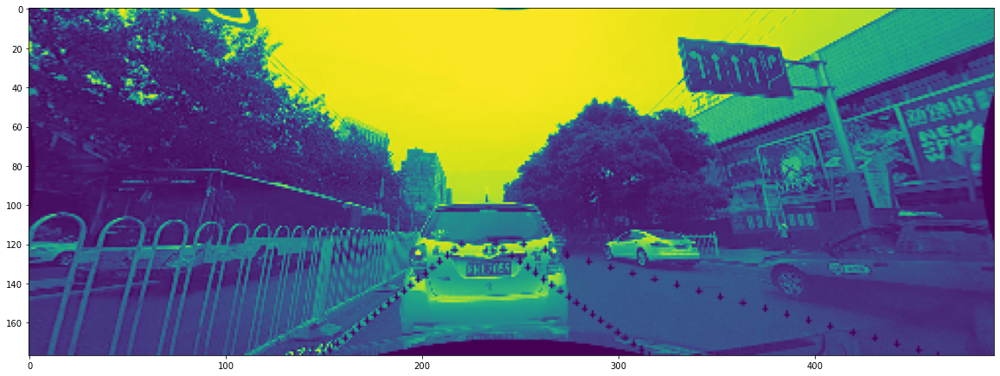

In [120]:
plt.imshow(y_train[5])
plt.gcf().set_size_inches(20, 10)

In [42]:
data_loader = torch.utils.data.DataLoader(dataset=images_batch_processed, batch_size = 32)

(118, 328)


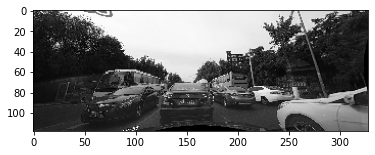

In [43]:
dataiter = iter(data_loader)
images = dataiter.next()
# img1 = tf.image.resize(images_batch[10], [59,164], preserve_aspect_ratio=False)

width = 164*2
height = 59*2
dsize = (width, height)
img1 = cv2.resize(np.array(images_batch[10]), dsize)/255
print(img1.shape)
plt.imshow(img1)
# img2 = tf.convert_to_tensor(newbatch1[0]/255)
# plt.imshow(img2)
# torch.min(np.array(img2)), torch.max(np.array(img2))

In [50]:
num_epochs = 50
outputs = []
for epoch in range(num_epochs):
    for img in data_loader:
        img = img.reshape(-1,59*164)
        recon = model(img)
        loss = criterion(recon, img)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    print(f'Epoch:{epoch+1}, Loss:{loss.item():.4f}')
    outputs.append((epoch, img, recon))

Epoch:1, Loss:0.0285
Epoch:2, Loss:0.0303
Epoch:3, Loss:0.0321
Epoch:4, Loss:0.0314
Epoch:5, Loss:0.0314
Epoch:6, Loss:0.0326
Epoch:7, Loss:0.0317
Epoch:8, Loss:0.0318
Epoch:9, Loss:0.0331
Epoch:10, Loss:0.0317
Epoch:11, Loss:0.0339
Epoch:12, Loss:0.0302
Epoch:13, Loss:0.0313
Epoch:14, Loss:0.0323
Epoch:15, Loss:0.0326
Epoch:16, Loss:0.0290
Epoch:17, Loss:0.0285
Epoch:18, Loss:0.0303
Epoch:19, Loss:0.0306
Epoch:20, Loss:0.0307
Epoch:21, Loss:0.0309
Epoch:22, Loss:0.0302
Epoch:23, Loss:0.0302
Epoch:24, Loss:0.0290
Epoch:25, Loss:0.0286
Epoch:26, Loss:0.0277
Epoch:27, Loss:0.0337
Epoch:28, Loss:0.0289
Epoch:29, Loss:0.0286
Epoch:30, Loss:0.0322
Epoch:31, Loss:0.0287
Epoch:32, Loss:0.0285
Epoch:33, Loss:0.0280
Epoch:34, Loss:0.0285
Epoch:35, Loss:0.0284
Epoch:36, Loss:0.0287
Epoch:37, Loss:0.0283
Epoch:38, Loss:0.0290
Epoch:39, Loss:0.0289
Epoch:40, Loss:0.0283
Epoch:41, Loss:0.0273
Epoch:42, Loss:0.0288
Epoch:43, Loss:0.0278
Epoch:44, Loss:0.0272
Epoch:45, Loss:0.0281
Epoch:46, Loss:0.02

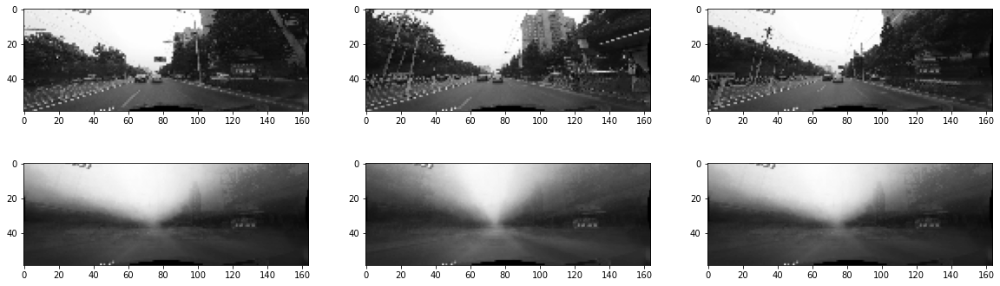

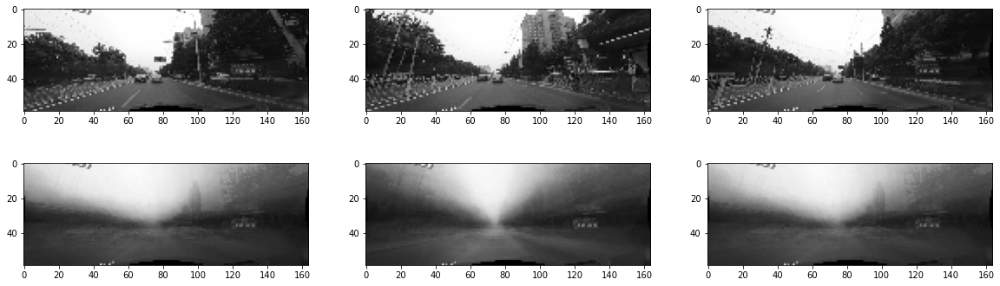

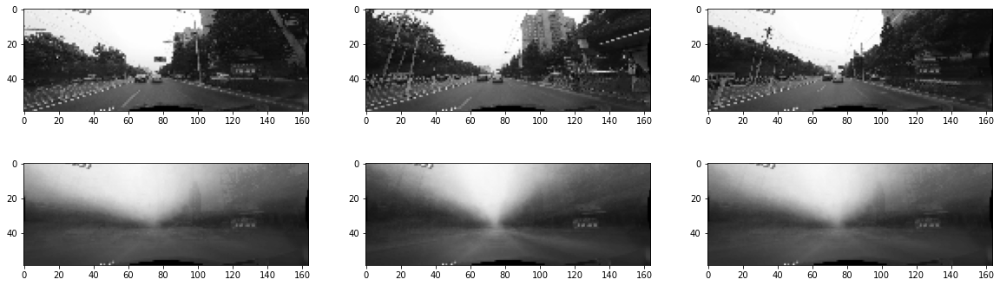

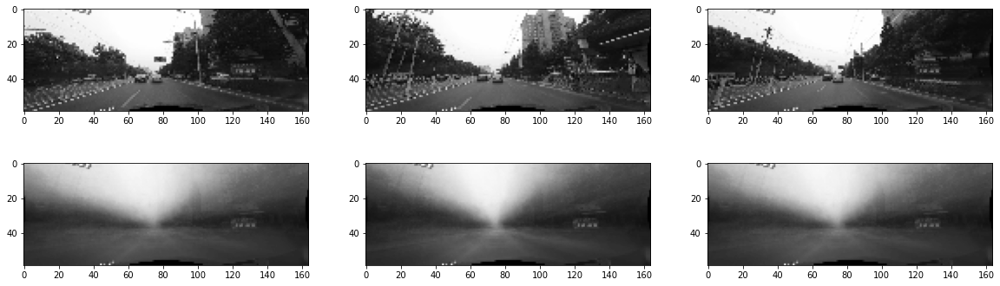

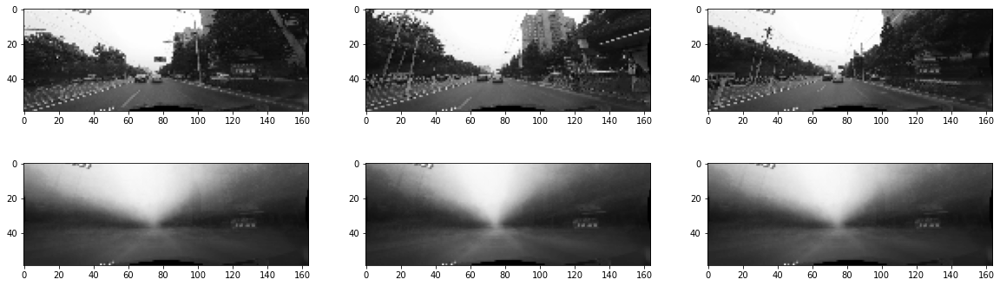

...

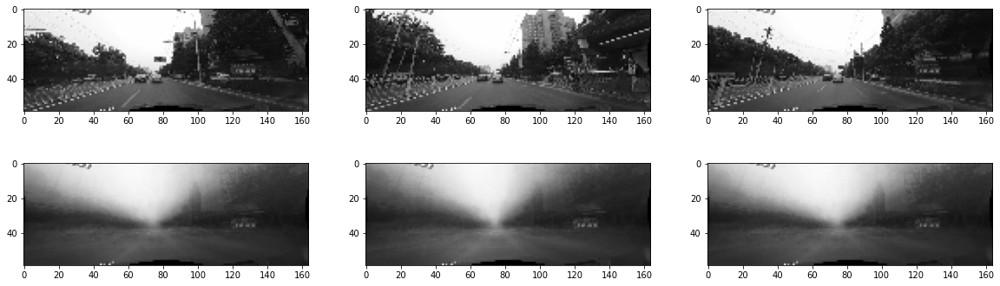

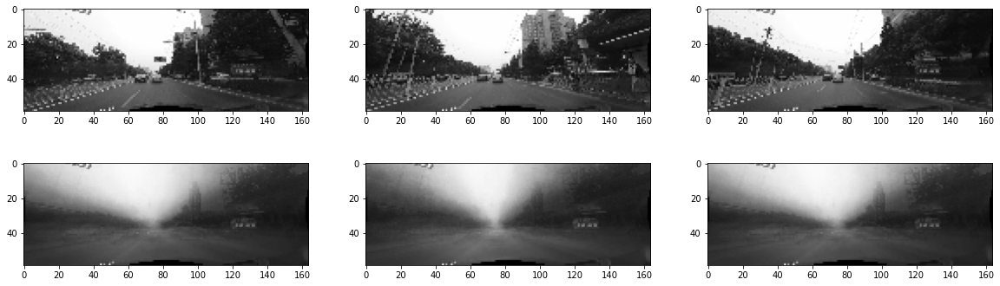

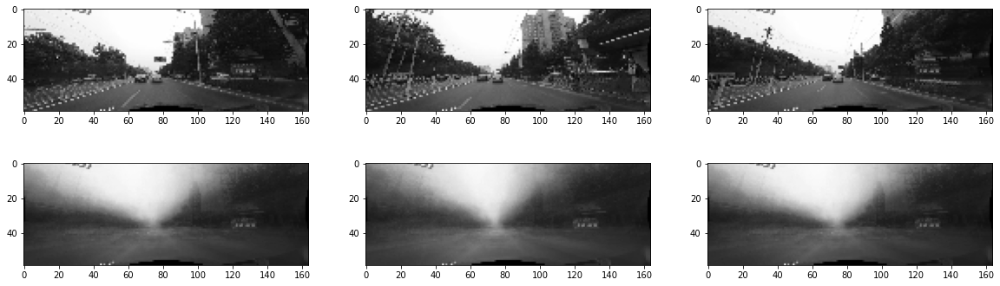

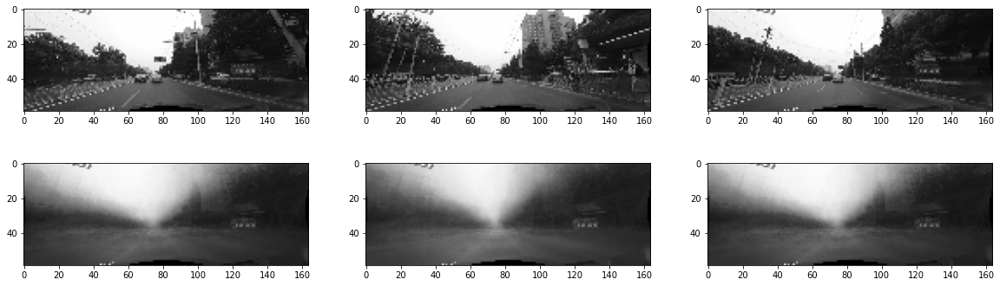

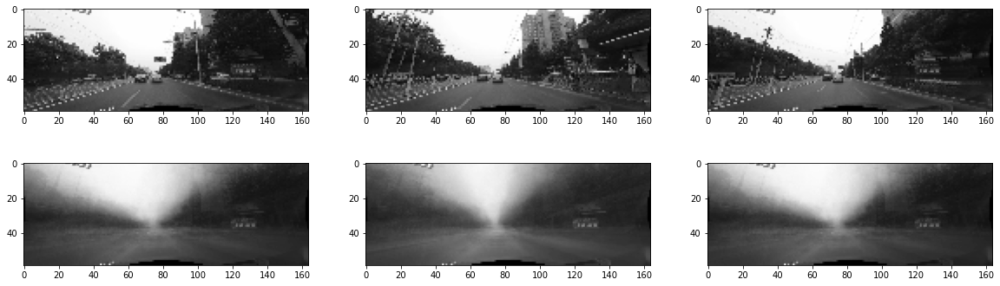

In [51]:
for k in range(0,num_epochs, 4):
    plt.figure(figsize=(20,6))
    plt.gray()
    imgs = outputs[k][1].detach().numpy()
    recon = outputs[k][2].detach().numpy()
    for i, item in enumerate(imgs):
        if i >=3: break
        plt.subplot(2,3,i+1)
        item = item.reshape(-1,59,164)
        plt.imshow(item[0])
    
    for i, item in enumerate(recon):
        if i >=3: break
        plt.subplot(2,3,3+i+1)
        item = item.reshape(-1,59,164)
        plt.imshow(item[0])

### AutoEncoder with single layer for converting Images to Images with Lanes (not primary)
* The model is consists of just one layer in the encoder and one layer inthe decoder side.
* The model takes the original image as input.
* Output is given as images with lanes drawn on them while training

In [85]:
# IMG_SHAPE = (images_batch[0].shape)
IMG_SHAPE = X_train.shape[1:]

encoder, decoder = build_autoencoder(IMG_SHAPE, 164*3)

inp = Input(IMG_SHAPE)
code = encoder(inp)
reconstruction = decoder(code)

autoencoder = Model(inp,reconstruction)
autoencoder.compile(optimizer='adamax', loss='mse')

autoencoder.summary()

Model: "model_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_39 (InputLayer)        [(None, 177, 492)]        0         
_________________________________________________________________
sequential_24 (Sequential)   (None, 492)               42845820  
_________________________________________________________________
sequential_25 (Sequential)   (None, 177, 492)          42932412  
Total params: 85,778,232
Trainable params: 85,778,232
Non-trainable params: 0
_________________________________________________________________


In [86]:
epochs=100
history = autoencoder.fit(x=X_train, y=y_train, epochs=epochs,
                validation_data=(X_test, y_test))

Epoch 1/100
63/63 [==============================] - 87s 1s/step - loss: 15.6543 - val_loss: 0.0745
Epoch 2/100
63/63 [==============================] - 54s 853ms/step - loss: 0.0685 - val_loss: 0.0493
Epoch 3/100
63/63 [==============================] - 54s 859ms/step - loss: 0.0580 - val_loss: 0.0473
Epoch 4/100
63/63 [==============================] - 56s 887ms/step - loss: 0.0546 - val_loss: 0.0464
Epoch 5/100
63/63 [==============================] - 55s 881ms/step - loss: 0.0537 - val_loss: 0.0450
Epoch 6/100
63/63 [==============================] - 51s 808ms/step - loss: 0.0525 - val_loss: 0.0454
Epoch 7/100
63/63 [==============================] - 45s 718ms/step - loss: 0.0513 - val_loss: 0.0435
Epoch 8/100
63/63 [==============================] - 45s 712ms/step - loss: 0.0503 - val_loss: 0.0426
Epoch 9/100
63/63 [==============================] - 45s 719ms/step - loss: 0.0492 - val_loss: 0.0423
Epoch 10/100
63/63 [==============================] - 47s 743ms/step - loss: 0.0479 

In [102]:
model_name = f"lane-detection-{IMG_SHAPE}-image-shape-{'Auto-Encoder'}-{epochs}-epochs.model"
autoencoder.save(model_name)

INFO:tensorflow:Assets written to: lane-detection-(177, 492)-image-shape-Auto-Encoder-100-epochs.model\assets


In [110]:
modelweights_name = f"model-weights-lane-detection-{IMG_SHAPE}-image-shape-{'Auto-Encoder'}-{epochs}-epochs.model"
autoencoder.save_weights(modelweights_name)

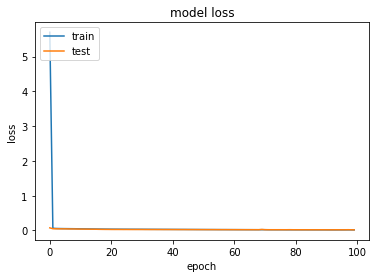

In [87]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
X_test

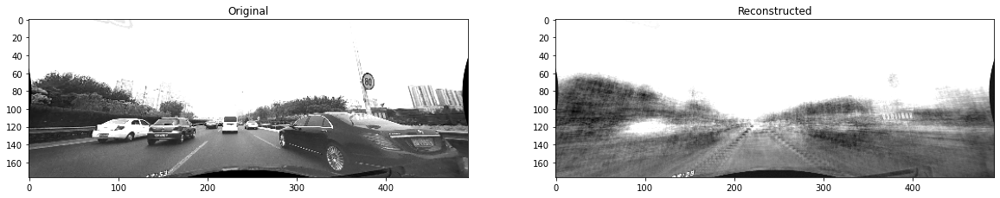

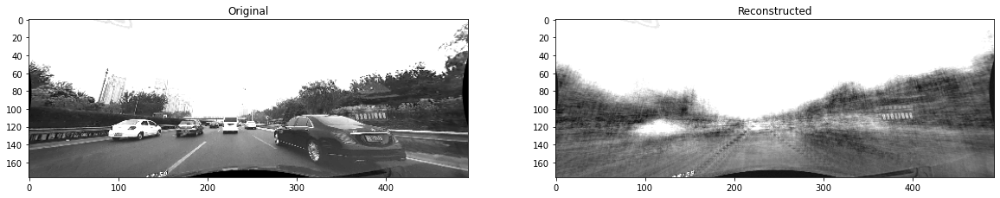

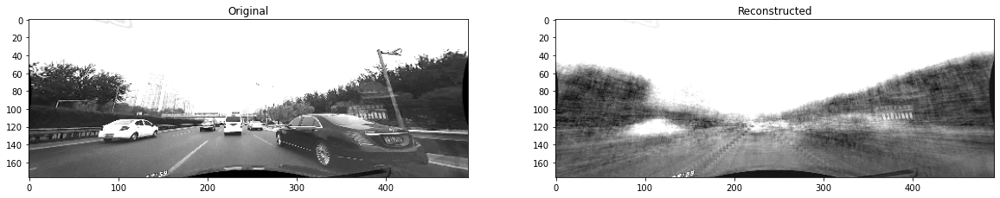

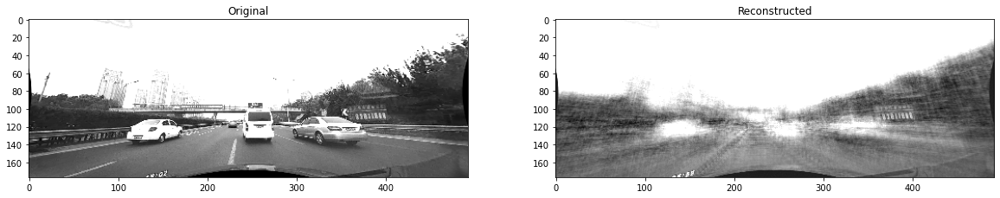

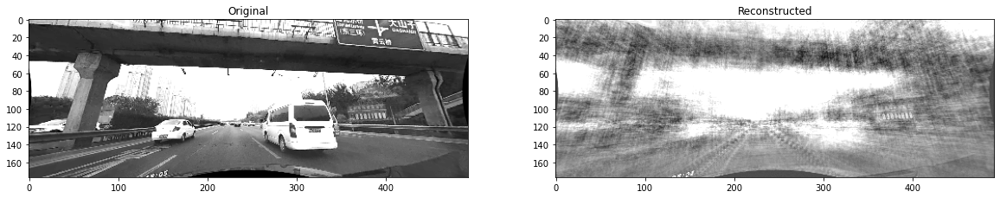

In [119]:
def show_image(x):
    plt.imshow(np.clip(x + 0.5, 0, 1), cmap = 'gray')
    
def visualize(img,encoder,decoder):
    """Draws original, encoded and decoded images"""
    # img[None] will have shape of (1, 32, 32, 3) which is the same as the model input
    code = encoder.predict(img[None])[0]
    reco = decoder.predict(code[None])[0]

    plt.subplot(1,2,1)
    plt.gcf().set_size_inches(20, 10)
    plt.title("Original")
    show_image(img)

#     plt.subplot(1,3,2)
#     plt.title("Code")
#     plt.imshow(code.reshape([code.shape[-1]//2,-1]))

    plt.subplot(1,2,2)
    plt.gcf().set_size_inches(20, 10)
    
    plt.title("Reconstructed")
    show_image(reco)
    plt.show()

for i in range(5,10):
    img = X_test[i]
    visualize(img,encoder,decoder)

#### As you can see the Image rendered by the odel does not ouput clear images and the Lanes though visible are extremly low def.

In [105]:
encoder, decoder = build_autoencoder(IMG_SHAPE, 164*3)

inp = Input(IMG_SHAPE)
code = encoder(inp)
reconstruction = decoder(code)

AEmodel = Model(inp,reconstruction)

In [111]:
AEmodel.load_weights(modelweights_name)

In [112]:
AEmodel.summary()

Model: "model_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_48 (InputLayer)        [(None, 177, 492)]        0         
_________________________________________________________________
sequential_30 (Sequential)   (None, 492)               42845820  
_________________________________________________________________
sequential_31 (Sequential)   (None, 177, 492)          42932412  
Total params: 85,778,232
Trainable params: 85,778,232
Non-trainable params: 0
_________________________________________________________________


In [113]:
X_train = np.array(tf.map_fn(resize_fn, x_train[2160:4160])/255)
# label_batch = torch.from_numpy(y_train) 
y_train = np.array(tf.map_fn(resize_fn, y_train_seg[2160:4160])/255)

X_test = np.array(tf.map_fn(resize_fn, x_train[4160:4320])/255)
# label_batch = torch.from_numpy(y_train) 
y_test = np.array(tf.map_fn(resize_fn, y_train_seg[4160:4320])/255)
X_train.shape, y_train.shape,  X_test.shape, y_test.shape

((2000, 177, 492), (2000, 177, 492), (160, 177, 492), (160, 177, 492))

In [115]:
AEmodel.compile(optimizer='adamax', loss='mse')

In [116]:
epochs=100
history = AEmodel.fit(x=X_train, y=y_train, epochs=epochs,
                validation_data=(X_test, y_test))

Epoch 1/100
63/63 [==============================] - 100s 779ms/step - loss: 0.0179 - val_loss: 0.0202
Epoch 2/100
63/63 [==============================] - 45s 714ms/step - loss: 0.0159 - val_loss: 0.0205
Epoch 3/100
63/63 [==============================] - 45s 712ms/step - loss: 0.0149 - val_loss: 0.0185
Epoch 4/100
63/63 [==============================] - 45s 719ms/step - loss: 0.0139 - val_loss: 0.0185
Epoch 5/100
63/63 [==============================] - 47s 749ms/step - loss: 0.0137 - val_loss: 0.0197
Epoch 6/100
63/63 [==============================] - 47s 745ms/step - loss: 0.0133 - val_loss: 0.0184
Epoch 7/100
63/63 [==============================] - 49s 780ms/step - loss: 0.0134 - val_loss: 0.0174
Epoch 8/100
63/63 [==============================] - 46s 738ms/step - loss: 0.0121 - val_loss: 0.0178
Epoch 9/100
63/63 [==============================] - 46s 737ms/step - loss: 0.0121 - val_loss: 0.0181
Epoch 10/100
63/63 [==============================] - 47s 745ms/step - loss: 0.01

In [ ]:
modelweights1_name = f"model-weights-1-lane-detection-{IMG_SHAPE}-image-shape-{'Auto-Encoder'}-{epochs}-epochs.model"
AEmodel.save_weights(modelweights_name)

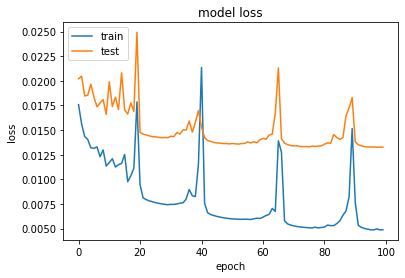

In [117]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

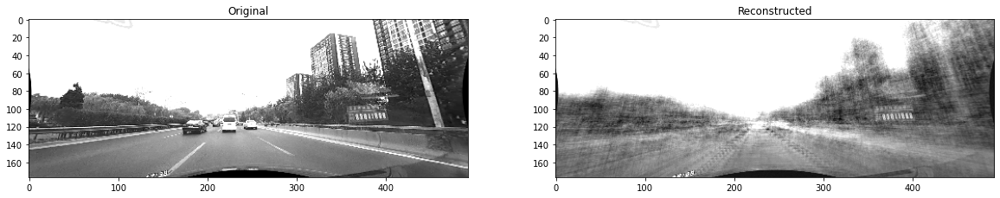

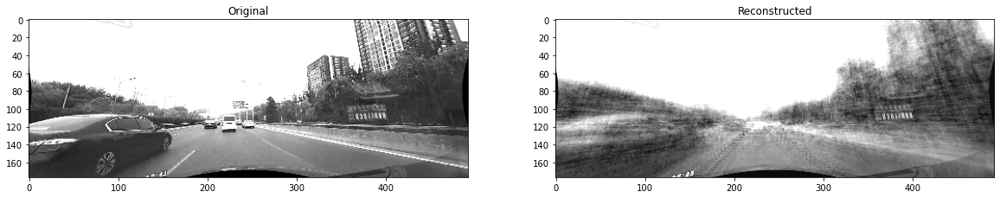

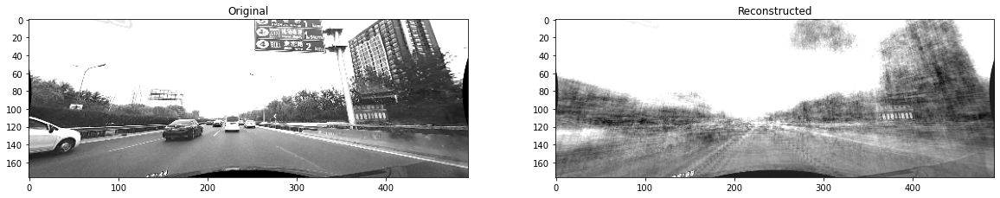

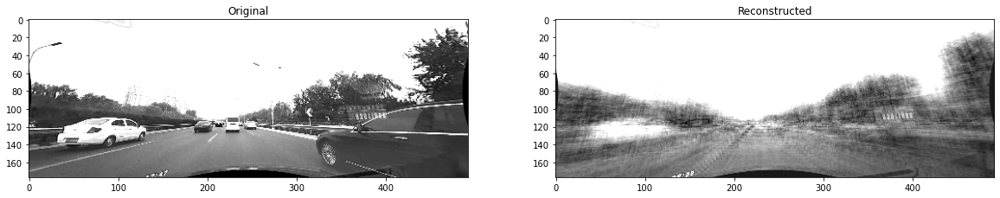

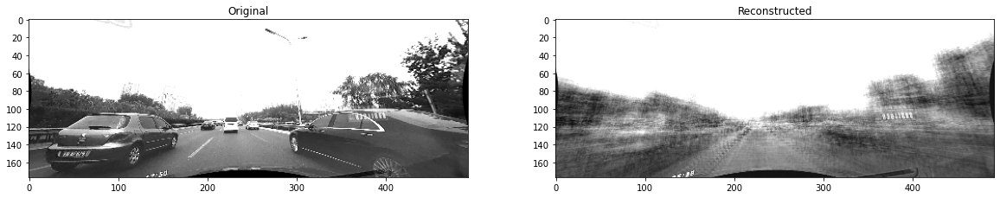

In [118]:
for i in range(5):
    img = X_test[i]
    visualize(img,encoder,decoder)

#### Training again on the same model with more data to see if model improves.
#### As you can see the Image rendered by the model does not ouput clear images and the Lanes though visible are extremly low def.

In [11]:
# IMAGE RESIZER FUNCTION

def resize_fn(x):
    multiplier = 3
    width = 164*multiplier
    height = 59*multiplier
    channel = 3
    dsize = (width, height)
    img_resized = cv2.resize(np.array(x), dsize)
    return img_resized
    

In [21]:
images_batch_processed = images_batch[:1000]
images_batch_processed.shape

torch.Size([500, 590, 1640])

In [99]:
newbatch1 = tf.map_fn(resize_fn, newbatch)
newbatch1.shape

TensorShape([10, 177, 492])

In [11]:
import tensorflow as tf
# resized = tf.image.resize(
#     images_batch.reshape(590,1640,5580), [59,164],preserve_aspect_ratio=False,
#     antialias=False, name=None
# )
# resized.shape

In [50]:
# images_batch_resized = torch.from_numpy(np.array(resized))
# images_batch_resized.shape

torch.Size([59, 164, 5580])

In [52]:
# images_batch_resized2 = images_batch_resized.reshape(5580,59,164)
# images_batch_resized2.shape

torch.Size([5580, 59, 164])

In [40]:
images_batch_resized = tf.map_fn(resize_fn, images_batch)

In [41]:
np.array(images_batch_resized/255).dtype

dtype('float32')

In [57]:
# images_batch = torch.from_numpy(x_train)

In [19]:
np.array(images_batch_resized).shape

(1000, 177, 492)

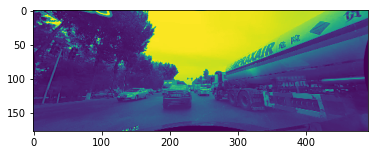

In [17]:
plt.imshow(images_batch_resized[0])

In [41]:
images_batch_processed = torch.from_numpy(np.array(images_batch_resized/255))

tensor([[0.2980, 0.2980, 0.2745,  ..., 0.3059, 0.2275, 0.1412],
        [0.4118, 0.3373, 0.3137,  ..., 0.1490, 0.1333, 0.1333],
        [0.4118, 0.4118, 0.7804,  ..., 0.1294, 0.1412, 0.1255],
        ...,
        [0.2627, 0.2627, 0.2667,  ..., 0.2118, 0.2118, 0.2118],
        [0.2314, 0.2078, 0.2157,  ..., 0.3961, 0.3843, 0.3176],
        [0.2588, 0.2157, 0.3804,  ..., 0.4353, 0.3765, 0.3373]])

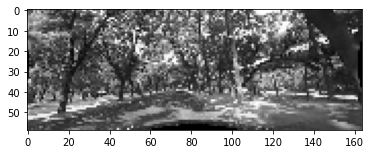

In [28]:
plt.imshow(images_batch_processed[800])
images_batch_processed[800]

In [33]:
type(images_batch_resized)

tensorflow.python.framework.ops.EagerTensor

### Attemptng to train the same AutoEncoder with Color Images.

In [3]:
# ++++++++++++++++ COLOR ++++++++++++++++++++++

In [8]:
X_train_c = np.load("data/extracted/X_train_color_161_90_seg.npy", mmap_mode='r')[:1080]
y_train_c = np.load("data/extracted/y_train_colo_161_90_seg.npy", mmap_mode='r')
X_train_c.shape, y_train_c.shape

((1080, 590, 1640, 3), (1080, 590, 1640, 3))

In [9]:
X_train_c = np.array(tf.map_fn(resize_fn, X_train_c[:920])/255)
y_train_c = np.array(tf.map_fn(resize_fn, y_train_c[:920])/255)

X_test_c = np.array(tf.map_fn(resize_fn, X_train_c[920:1080])/255)
y_test_c = np.array(tf.map_fn(resize_fn, y_train_c[920:1080])/255)

In [11]:
X_train_c.shape, y_train_c.shape, X_test_c.shape, y_test_c.shape

((920, 177, 492, 3), (920, 177, 492, 3), (0,), (0,))

In [59]:
# IMG_SHAPE = (images_batch[0].shape)
IMG_SHAPE = X_train_c.shape[1:]

encoder, decoder = build_autoencoder(IMG_SHAPE, 164*3)

inp = Input(IMG_SHAPE)
code = encoder(inp)
reconstruction = decoder(code)

autoencoder = Model(inp,reconstruction)
autoencoder.compile(optimizer='adamax', loss='mse')

autoencoder.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_9 (InputLayer)         [(None, 177, 492, 3)]     0         
_________________________________________________________________
sequential_4 (Sequential)    (None, 492)               128536476 
_________________________________________________________________
sequential_5 (Sequential)    (None, 177, 492, 3)       128797236 
Total params: 257,333,712
Trainable params: 257,333,712
Non-trainable params: 0
_________________________________________________________________


In [32]:
np.zeros((590,1640,3)).shape

(590, 1640, 3)

In [ ]:
if return_img == True:
        df1 = pd.DataFrame(np.array([np.array(x).astype(int), np.array(y).astype(int)]).T)
        arr = df1.to_numpy()
        img = copy.deepcopy(img0)

        #loop through each coordinate pair in arr
        for item in arr:
            cv2.drawMarker(img0, (item[0], item[1]),(0,255,0), markerType=cv2.MARKER_CROSS , 
            markerSize=11, thickness=2, line_type=cv2.LINE_AA)
#         image = cv2.circle(img0, (x,y), radius=0, color=(0, 0, 255), thickness=-1)
        return img,img0

In [34]:
y_train_annotation = np.load("data/extracted/y_train_161_90.npy",allow_pickle=True)

In [35]:
y_train_annotation.shape

(1020, 2)

In [118]:
lane_image=[]
for idx,i in enumerate(y_train_annotation):
    if idx%60 == 0 or idx <1001:
        print(idx)
    x, y = i
    df1 = pd.DataFrame(np.array([np.array(x).astype(int), np.array(y).astype(int)]).T)
    arr = df1.to_numpy()
    img0 = np.zeros((590,1640,3))
    #loop through each coordinate pair in arr
    for item in arr:
        cv2.drawMarker(img0, (item[0], item[1]),(0,255,0), markerType=cv2.MARKER_CROSS , 
            markerSize=11, thickness=2, line_type=cv2.LINE_AA)
#         image = cv2.circle(img0, (x,y), radius=0, color=(0, 0, 255), thickness=-1)
    lane_image.append(resize_fn(img0))

In [47]:
lane_image = np.array(lane_image)

In [48]:
lane_image.shape

(1020, 177, 492, 3)

In [57]:
y_train_c_lane = lane_image[:920]
y_test_c_lane = lane_image[920:]

X_train_c = np.load("data/extracted/X_train_color_161_90_seg.npy", mmap_mode='r')[:1080]
X_test_c = np.array(tf.map_fn(resize_fn, X_train_c[920:1020])/255)
X_train_c = np.array(tf.map_fn(resize_fn, X_train_c[:920])/255)
y_train_c_lane.shape, y_test_c_lane.shape

((920, 177, 492, 3), (100, 177, 492, 3))

In [58]:
X_train_c.shape, X_test_c.shape

((920, 177, 492, 3), (100, 177, 492, 3))

In [60]:
epochs=100
history = autoencoder.fit(x=X_train_c, y=y_train_c, epochs=epochs,
                validation_data=(X_test_c, y_test_c))

Epoch 1/100
 9/29 [========>.....................] - ETA: 5:16 - loss: 277.8413

ResourceExhaustedError:  OOM when allocating tensor with shape[261252,492] and type float on /job:localhost/replica:0/task:0/device:CPU:0 by allocator cpu
	 [[node gradient_tape/model_2/sequential_4/dense_4/MatMul (defined at <ipython-input-60-43b0b4f70100>:2) ]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.
 [Op:__inference_train_function_25594]

Function call stack:
train_function


##### - System lacked the resources to perform the above training 

# FINAL MODEL SUBMISSION

## AutoEncoder with single layer for converting Images to Binary Image containing only the Lanes (Primary Model)
* The model consists of just one layer in the encoder and one layer inthe decoder side.
* The model takes the original image as input.
* Output is given as a Binary images with just the lanes in them.(as shown below)
* The Input image is resized to 1/30th the orignal size (Max the system could take)
* Three Trainings
    1. train:2000, test:400, epochs:100 - model weights saved
    2. train:2000, test:400, epochs:100 - model weights saved
    3. train:400, test:380, epochs:130 - model weights saved

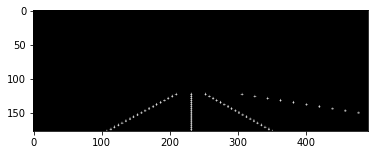

In [37]:
plt.imshow(lane_image[0], cmap = 'gray')

In [2]:
from keras.layers import Dense, Flatten, Reshape, Input, InputLayer
from keras.models import Sequential, Model

def build_autoencoder(img_shape, code_size):
    # The encoder
    encoder = Sequential()
    encoder.add(InputLayer(img_shape))
    encoder.add(Flatten())
    encoder.add(Dense(code_size))

    # The decoder
    decoder = Sequential()
    decoder.add(InputLayer((code_size,)))
    decoder.add(Dense(np.prod(img_shape))) # np.prod(img_shape) is the same as 32*32*3, it's more generic than saying 3072
    decoder.add(Reshape(img_shape))

    return encoder, decoder

In [46]:
# IMAGE RESIZER FUNCTION

def resize_fn(x):
    multiplier = 3
    width = 164*multiplier
    height = 59*multiplier
    channel = 3
    dsize = (width, height)
    img_resized = cv2.resize(np.array(x), dsize)
    return img_resized
   

### Function that will help visualize the input and output images for the Test data

In [4]:
def show_image(x):
#     plt.imshow(np.clip(x + 0.5, 0, 1), cmap = 'gray')
    plt.imshow(np.clip(x + 0.5, 0, 1), cmap = 'gray')
    
    
def visualize(img,encoder,decoder):
    """Draws original, encoded and decoded images"""
    # img[None] will have shape of (1, 32, 32, 3) which is the same as the model input
    code = encoder.predict(img[None])[0]
    reco = decoder.predict(code[None])[0]

    plt.subplot(1,2,1)
    plt.gcf().set_size_inches(20, 10)
    plt.title("Original")
    show_image(img)
    
    plt.subplot(1,2,2)
    plt.gcf().set_size_inches(20, 10)
    
    plt.title("Reconstructed")
    show_image(reco)
    plt.show()

In [48]:
x_train = np.load("data/extracted/X_train_161_90_org.npy", mmap_mode='r')
x_train.shape

(5580, 590, 1640)

In [31]:
y_train = np.load("data/extracted/y_train_161_90_org.npy", allow_pickle = True)
y_train.shape

(5580, 2)

## 1st Model TRAINING
### Creating the BInary Image that holds just the Lanes.

In [32]:
lane_image=[]
for idx,i in enumerate(y_train):
    if idx ==2400:
        break
    if idx%60 == 0:
        print(idx)
    x, y = i
    df1 = pd.DataFrame(np.array([np.array(x).astype(int), np.array(y).astype(int)]).T)
    arr = df1.to_numpy()
    img0 = np.zeros((590,1640))
    #loop through each coordinate pair in arr
    for item in arr:
        cv2.drawMarker(img0, (item[0], item[1]),(255,255), markerType=cv2.MARKER_CROSS , 
            markerSize=11, thickness=2, line_type=cv2.LINE_AA)
#         image = cv2.circle(img0, (x,y), radius=0, color=(0, 0, 255), thickness=-1)
    lane_image.append(resize_fn(img0))

0
60
120
180
240
300
360
420
480
540
600
660
720
780
840
900
960
1020
1080
1140
1200
1260
1320
1380
1440
1500
1560
1620
1680
1740
1800
1860
1920
1980
2040
2100
2160
2220
2280
2340


In [33]:
lane_image = np.array(lane_image)/255

In [34]:
lane_image.shape

(2400, 177, 492)

### Getting and setting the X_train, y_train, X_test, y_test

In [38]:
y_train_bwlane = lane_image[:2000]
y_test_bwlane = lane_image[2000:]
y_train_bwlane.shape, y_test_bwlane.shape

((2000, 177, 492), (400, 177, 492))

In [49]:
X_train = np.array(tf.map_fn(resize_fn,x_train[:2000]))/255
X_test = np.array(tf.map_fn(resize_fn,x_train[2000:2400]))/255

X_train.shape, X_test.shape

((2000, 177, 492), (400, 177, 492))

### Calling Model and Compiling for first Time.

In [52]:
# IMG_SHAPE = (images_batch[0].shape)
IMG_SHAPE = X_train[0].shape

encoder, decoder = build_autoencoder(IMG_SHAPE, 164*3)

inp = Input(IMG_SHAPE)
code = encoder(inp)
reconstruction = decoder(code)

autoencoder = Model(inp,reconstruction)
autoencoder.compile(optimizer='adamax', loss='mse')

autoencoder.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 177, 492)]        0         
_________________________________________________________________
sequential_2 (Sequential)    (None, 492)               42845820  
_________________________________________________________________
sequential_3 (Sequential)    (None, 177, 492)          42932412  
Total params: 85,778,232
Trainable params: 85,778,232
Non-trainable params: 0
_________________________________________________________________


### Training Model

In [53]:
epochs=100
history = autoencoder.fit(x=X_train, y=y_train_bwlane, epochs=epochs,
                validation_data=(X_test, y_test_bwlane))

Epoch 1/100
63/63 [==============================] - 147s 987ms/step - loss: 8.4731 - val_loss: 0.0155
Epoch 2/100
63/63 [==============================] - 50s 791ms/step - loss: 0.0176 - val_loss: 0.0094
Epoch 3/100
63/63 [==============================] - 48s 766ms/step - loss: 0.0075 - val_loss: 0.0060
Epoch 4/100
63/63 [==============================] - 49s 781ms/step - loss: 0.0058 - val_loss: 0.0056
Epoch 5/100
63/63 [==============================] - 49s 784ms/step - loss: 0.0050 - val_loss: 0.0045
Epoch 6/100
63/63 [==============================] - 50s 788ms/step - loss: 0.0044 - val_loss: 0.0039
Epoch 7/100
63/63 [==============================] - 50s 791ms/step - loss: 0.0040 - val_loss: 0.0037
Epoch 8/100
63/63 [==============================] - 50s 796ms/step - loss: 0.0037 - val_loss: 0.0034
Epoch 9/100
63/63 [==============================] - 49s 780ms/step - loss: 0.0036 - val_loss: 0.0033
Epoch 10/100
63/63 [==============================] - 50s 793ms/step - loss: 0.00

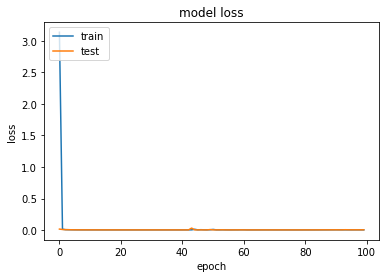

In [58]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

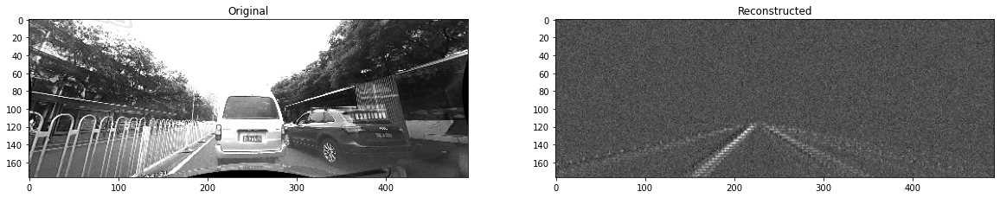

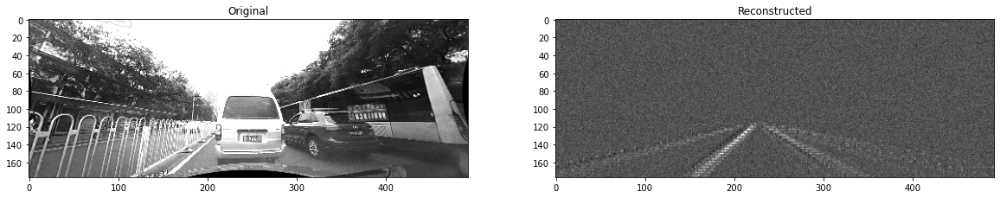

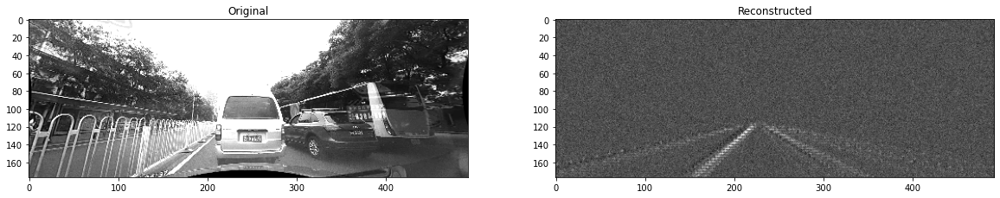

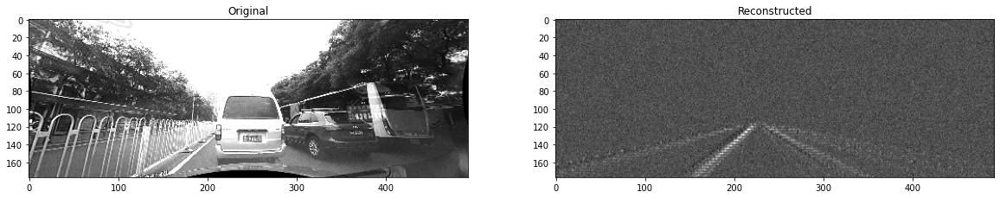

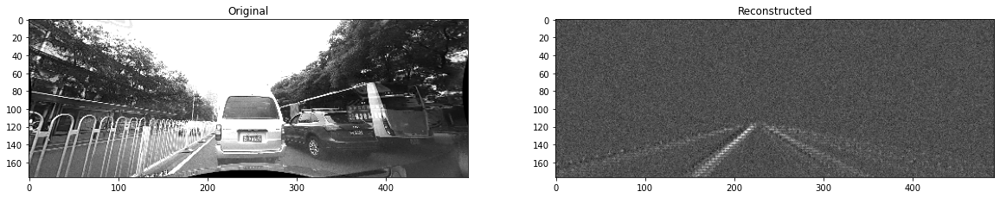

In [65]:
for i in range(100,105):
    img = X_test[i]
    visualize(img,encoder,decoder)

In [7]:
modelweights_name = f"model-weights-lane-detection-returning-bw_image_with_lane-{IMG_SHAPE}-image-shape-{'Auto-Encoder'}-{epochs}-epochs.model"
# autoencoder.save_weights(modelweights_name)

## 2nd Model TRAINING
### Creating the BInary Image that holds just the Lanes.

In [7]:
y_train = np.load("data/extracted/y_train_161_90_org.npy", allow_pickle = True)
y_train.shape

(5580, 2)

In [8]:
lane_image_1=[]
for idx,i in enumerate(y_train[2400:]):
    if idx ==2400:
        break
    if idx%60 == 0:
        print(idx)
    x, y = i
    df1 = pd.DataFrame(np.array([np.array(x).astype(int), np.array(y).astype(int)]).T)
    arr = df1.to_numpy()
    img0 = np.zeros((590,1640))
    #loop through each coordinate pair in arr
    for item in arr:
        cv2.drawMarker(img0, (item[0], item[1]),(255,255), markerType=cv2.MARKER_CROSS , 
            markerSize=11, thickness=2, line_type=cv2.LINE_AA)
#         image = cv2.circle(img0, (x,y), radius=0, color=(0, 0, 255), thickness=-1)
    lane_image_1.append(resize_fn(img0))

0
60
120
180
240
300
360
420
480
540
600
660
720
780
840
900
960
1020
1080
1140
1200
1260
1320
1380
1440
1500
1560
1620
1680
1740
1800
1860
1920
1980
2040
2100
2160
2220
2280
2340


### Getting and setting the X_train, y_train, X_test, y_test

In [9]:
lane_image_1 = np.array(lane_image_1)/255
y_train_bwlane = lane_image_1[:2000]
y_test_bwlane = lane_image_1[2000:]
y_train_bwlane.shape, y_test_bwlane.shape

((2000, 177, 492), (400, 177, 492))

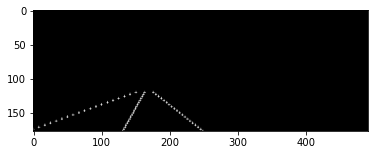

In [10]:
plt.imshow(y_train_bwlane[0],cmap='gray')

In [5]:
x_train = np.load("data/extracted/X_train_161_90_org.npy", mmap_mode='r')
x_train.shape

(5580, 590, 1640)

In [6]:
X_train = np.array(tf.map_fn(resize_fn,x_train[2400:4400]))/255
X_test = np.array(tf.map_fn(resize_fn,x_train[4400:4800]))/255

X_train.shape, X_test.shape

((2000, 177, 492), (400, 177, 492))

In [13]:
x_train = []

### Loading and compiling the model with the pretraiened weights of the last train

In [11]:
IMG_SHAPE = 177, 492
epochs=100
modelweights_name = f"model-weights\model-weights-lane-detection-returning-bw_image_with_lane-{IMG_SHAPE}-image-shape-{'Auto-Encoder'}-{epochs}-epochs.model"
modelweights_name

'model-weights\\model-weights-lane-detection-returning-bw_image_with_lane-(177, 492)-image-shape-Auto-Encoder-100-epochs.model'

In [12]:
encoder, decoder = build_autoencoder(IMG_SHAPE, 164*3)

inp = Input(IMG_SHAPE)
code = encoder(inp)
reconstruction = decoder(code)

autoencoder1 = Model(inp,reconstruction)
autoencoder1.load_weights(modelweights_name)
autoencoder1.compile(optimizer='adamax', loss='mse')

In [14]:
autoencoder1.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 177, 492)]        0         
_________________________________________________________________
sequential (Sequential)      (None, 492)               42845820  
_________________________________________________________________
sequential_1 (Sequential)    (None, 177, 492)          42932412  
Total params: 85,778,232
Trainable params: 85,778,232
Non-trainable params: 0
_________________________________________________________________


### Training Model

In [16]:
epochs=100
history1 = autoencoder1.fit(x=X_train, y=y_train_bwlane, epochs=epochs,
                validation_data=(X_test, y_test_bwlane))

Epoch 1/100
63/63 [==============================] - 130s 1s/step - loss: 0.0043 - val_loss: 0.0039
Epoch 2/100
63/63 [==============================] - 49s 784ms/step - loss: 0.0037 - val_loss: 0.0037
Epoch 3/100
63/63 [==============================] - 49s 781ms/step - loss: 0.0037 - val_loss: 0.0035
Epoch 4/100
63/63 [==============================] - 49s 782ms/step - loss: 0.0036 - val_loss: 0.0041
Epoch 5/100
63/63 [==============================] - 49s 781ms/step - loss: 0.0036 - val_loss: 0.0031
Epoch 6/100
63/63 [==============================] - 49s 777ms/step - loss: 0.0031 - val_loss: 0.0044
Epoch 7/100
63/63 [==============================] - 49s 776ms/step - loss: 0.0035 - val_loss: 0.0035
Epoch 8/100
63/63 [==============================] - 50s 800ms/step - loss: 0.0032 - val_loss: 0.0035
Epoch 9/100
63/63 [==============================] - 49s 782ms/step - loss: 0.0031 - val_loss: 0.0039
Epoch 10/100
63/63 [==============================] - 49s 778ms/step - loss: 0.0034 

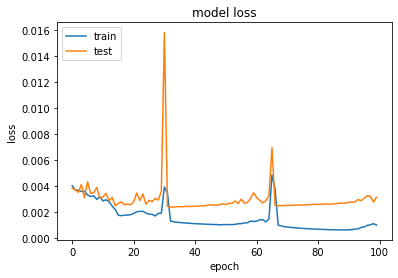

In [17]:
plt.plot(history1.history['loss'])
plt.plot(history1.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

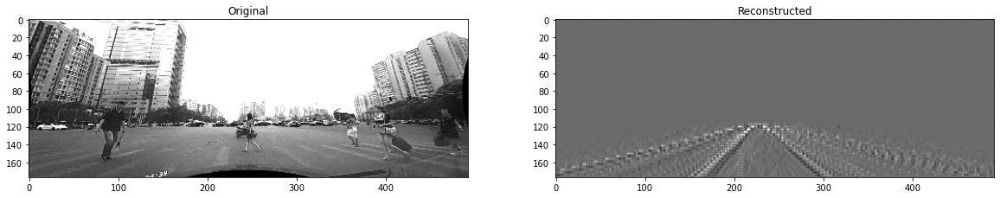

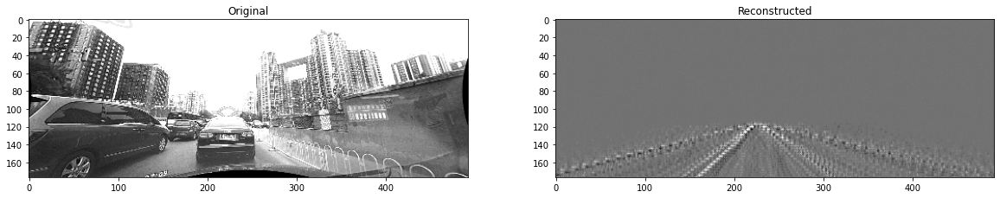

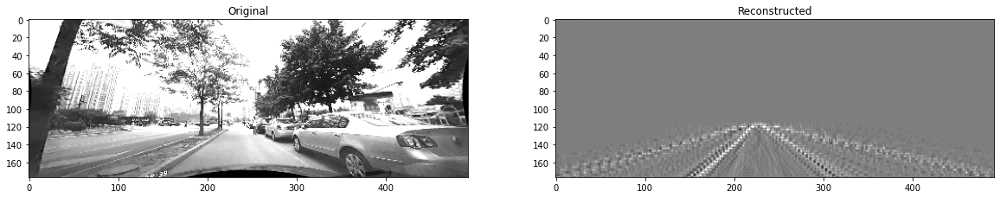

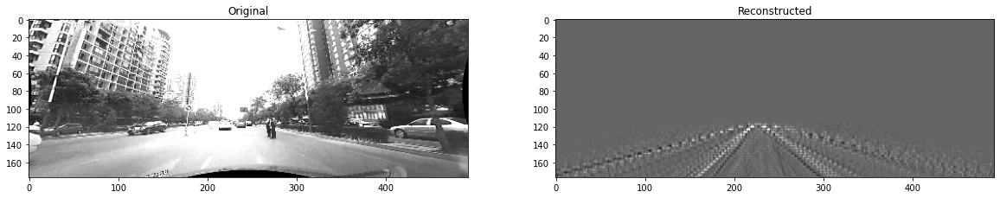

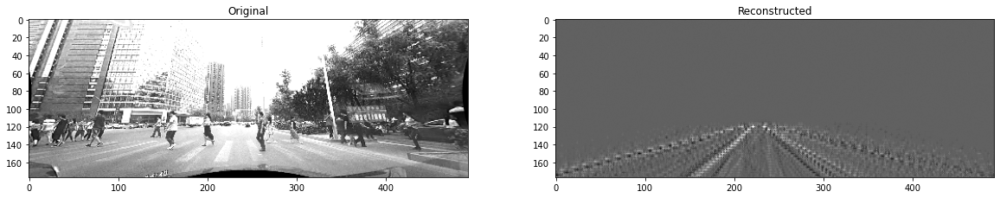

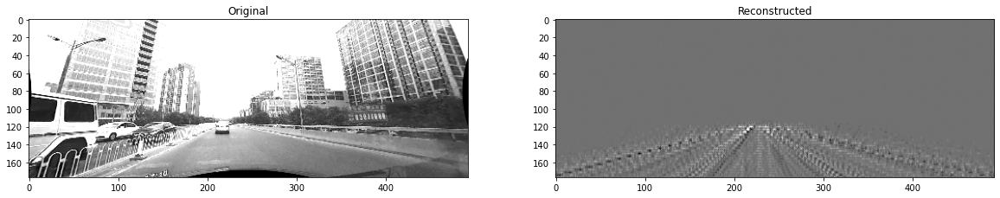

In [18]:
for i in range(100,370,50):
    img = X_test[i]
    visualize(img,encoder,decoder)

In [20]:
modelweights_name_2 = f"model-weights\model-weights-lane-detection-returning-bw_image_with_lane_V2-{IMG_SHAPE}-image-shape-{'Auto-Encoder'}-{epochs}-epochs.model"
# autoencoder1.save_weights(modelweights_name_2)

## 3rd and Final Model TRAINING
### Creating the BInary Image that holds just the Lanes.

In [22]:
lane_image_1=[]
for idx,i in enumerate(y_train[4800:]):
    if idx%60 == 0:
        print(idx)
    x, y = i
    df1 = pd.DataFrame(np.array([np.array(x).astype(int), np.array(y).astype(int)]).T)
    arr = df1.to_numpy()
    img0 = np.zeros((590,1640))
    #loop through each coordinate pair in arr
    for item in arr:
        cv2.drawMarker(img0, (item[0], item[1]),(255,255), markerType=cv2.MARKER_CROSS , 
            markerSize=11, thickness=2, line_type=cv2.LINE_AA)
#         image = cv2.circle(img0, (x,y), radius=0, color=(0, 0, 255), thickness=-1)
    lane_image_1.append(resize_fn(img0))

0
60
120
180
240
300
360
420
480
540
600
660
720


### Getting and setting the X_train, y_train, X_test, y_test

In [21]:
x_train = np.load("data/extracted/X_train_161_90_org.npy", mmap_mode='r')
X_train = np.array(tf.map_fn(resize_fn,x_train[4800:5200]))/255
X_test = np.array(tf.map_fn(resize_fn,x_train[5200:]))/255

X_train.shape, X_test.shape

((400, 177, 492), (380, 177, 492))

In [23]:
lane_image_1 = np.array(lane_image_1)/255
y_train_bwlane = lane_image_1[:400]
y_test_bwlane = lane_image_1[400:]
y_train_bwlane.shape, y_test_bwlane.shape

((400, 177, 492), (380, 177, 492))

### Loading and compiling the model with the pretraiened weights of the last train

In [24]:
encoder, decoder = build_autoencoder(IMG_SHAPE, 164*3)

inp = Input(IMG_SHAPE)
code = encoder(inp)
reconstruction = decoder(code)

autoencoder1 = Model(inp,reconstruction)
autoencoder1.load_weights(modelweights_name_2)
autoencoder1.compile(optimizer='adamax', loss='mse')

In [25]:
autoencoder1.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 177, 492)]        0         
_________________________________________________________________
sequential_2 (Sequential)    (None, 492)               42845820  
_________________________________________________________________
sequential_3 (Sequential)    (None, 177, 492)          42932412  
Total params: 85,778,232
Trainable params: 85,778,232
Non-trainable params: 0
_________________________________________________________________


### Training Model

In [27]:
epochs=200
history1 = autoencoder1.fit(x=X_train, y=y_train_bwlane, epochs=epochs,
                validation_data=(X_test, y_test_bwlane))

Epoch 1/200
13/13 [==============================] - 11s 887ms/step - loss: 0.0025 - val_loss: 0.0174
Epoch 2/200
13/13 [==============================] - 11s 876ms/step - loss: 0.0091 - val_loss: 0.0085
Epoch 3/200
13/13 [==============================] - 11s 872ms/step - loss: 0.0060 - val_loss: 0.0027
Epoch 4/200
13/13 [==============================] - 12s 898ms/step - loss: 0.0016 - val_loss: 0.0020
Epoch 5/200
13/13 [==============================] - 11s 892ms/step - loss: 0.0010 - val_loss: 0.0017
Epoch 6/200
13/13 [==============================] - 11s 885ms/step - loss: 7.1944e-04 - val_loss: 0.0017
Epoch 7/200
13/13 [==============================] - 12s 934ms/step - loss: 6.3306e-04 - val_loss: 0.0017
Epoch 8/200
13/13 [==============================] - 12s 913ms/step - loss: 5.9903e-04 - val_loss: 0.0016
Epoch 9/200
13/13 [==============================] - 13s 1s/step - loss: 5.7701e-04 - val_loss: 0.0016
Epoch 10/200
13/13 [==============================] - 12s 962ms/step 

Epoch 78/200
13/13 [==============================] - 12s 897ms/step - loss: 5.7455e-05 - val_loss: 0.0018
Epoch 79/200
13/13 [==============================] - 12s 904ms/step - loss: 5.5483e-05 - val_loss: 0.0019
Epoch 80/200
13/13 [==============================] - 11s 877ms/step - loss: 5.7120e-05 - val_loss: 0.0019
Epoch 81/200
13/13 [==============================] - 11s 872ms/step - loss: 5.3002e-05 - val_loss: 0.0019
Epoch 82/200
13/13 [==============================] - 11s 873ms/step - loss: 5.7188e-05 - val_loss: 0.0019
Epoch 83/200
13/13 [==============================] - 11s 882ms/step - loss: 5.5601e-05 - val_loss: 0.0019
Epoch 84/200
13/13 [==============================] - 11s 877ms/step - loss: 5.8853e-05 - val_loss: 0.0019
Epoch 85/200
13/13 [==============================] - 12s 898ms/step - loss: 6.2877e-05 - val_loss: 0.0018
Epoch 86/200
13/13 [==============================] - 11s 885ms/step - loss: 4.9280e-05 - val_loss: 0.0019
Epoch 87/200
13/13 [=================

ResourceExhaustedError:  OOM when allocating tensor with shape[492,87084] and type float on /job:localhost/replica:0/task:0/device:CPU:0 by allocator cpu
	 [[node Adamax/Adamax/update_2/ResourceApplyAdaMax (defined at <ipython-input-26-185f055f02c1>:2) ]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.
 [Op:__inference_train_function_36099]

Function call stack:
train_function


In [29]:
modelweights_name3 = f"model-weights\model-weights-lane-detection-returning-bw_image_with_lane-V3-{IMG_SHAPE}-image-shape-{'Auto-Encoder'}-{epochs}-epochs.model"
# autoencoder1.save_weights(modelweights_name3)

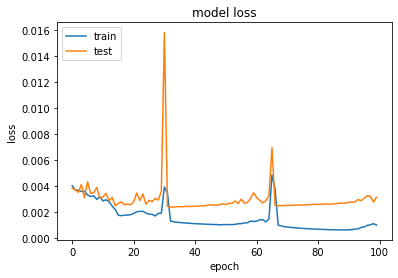

In [30]:
plt.plot(history1.history['loss'])
plt.plot(history1.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

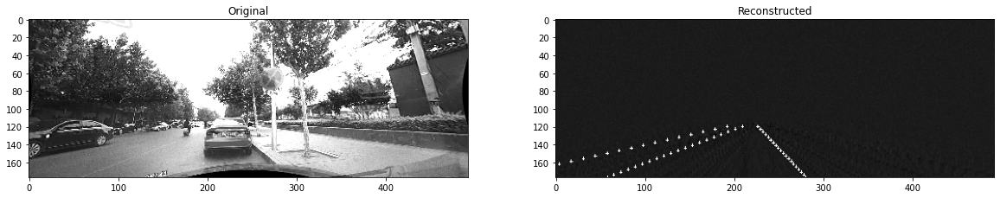

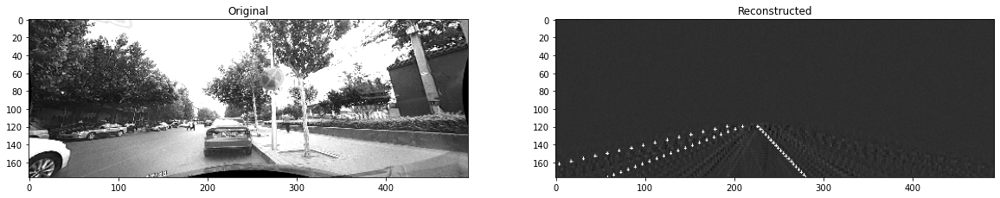

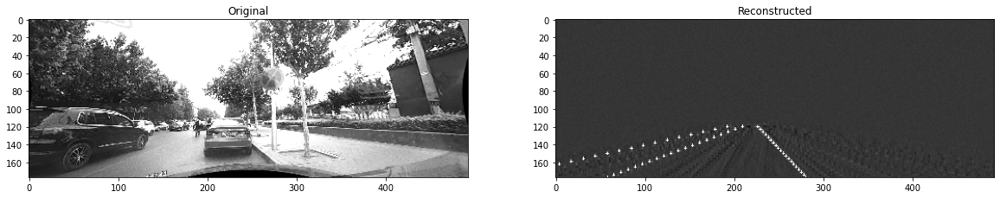

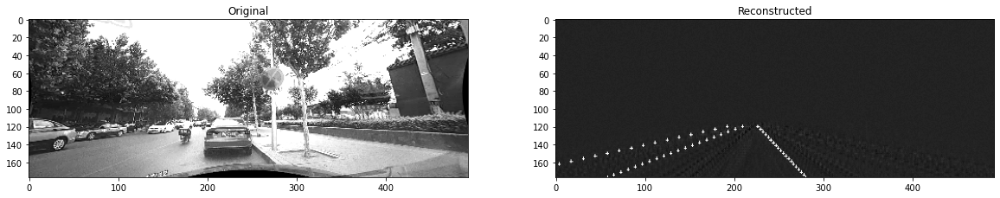

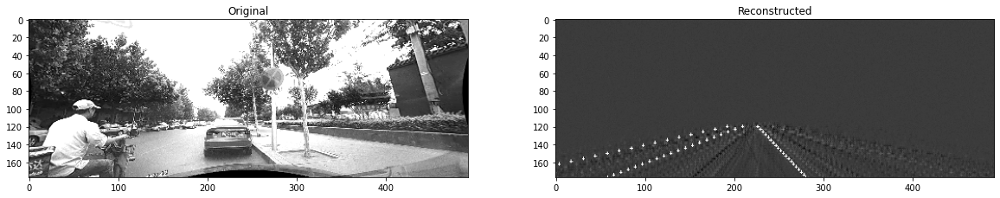

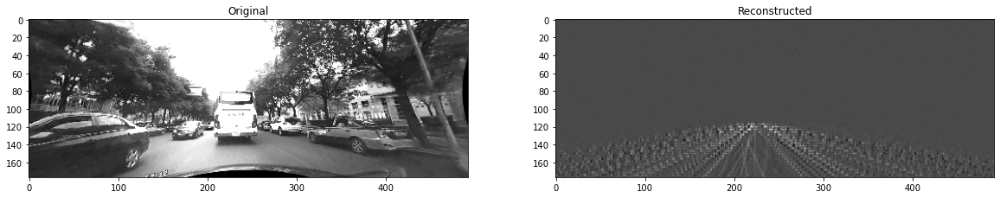

In [31]:
for i in range(0,280,50):
    img = X_test[i]
    visualize(img,encoder,decoder)

#### -As you can see from the reconstructed images the model has successfully been able to extract lanes from the original input test images using the autoencoder model we have trained.

### Comparing all three Models side by side 
(Couldnt do because of resource limitations- but code is accurate)

In [69]:
def model_load_compile(model_weights):
    encoder, decoder = build_autoencoder(IMG_SHAPE, 164*3)

    inp = Input(IMG_SHAPE)
    code = encoder(inp)
    reconstruction = decoder(code)

    autoencoder1 = Model(inp,reconstruction)
    autoencoder1.load_weights(model_weights)
    autoencoder1.compile(optimizer='adamax', loss='mse')
    return encoder, decoder

def visualize_result_from_trained_models(img,encoder,decoder, rownum, rowloc):
    code = encoder.predict(img[None])
    if rowloc==1: 
        plt.subplot(rownum,4,1)
        plt.gcf().set_size_inches(20, 2.5)
        name='Original'
        plt.title(name)
        
        plt.imshow(code, cmap='gray')


    name = 'Model '+ str(rowloc)
    reco = decoder.predict(code[None])
    plt.imshow(np.clip(reco[0] + 0.5, 0, 1), cmap = 'gray')

    plt.subplot(rownum,4,rowloc+1)
    plt.gcf().set_size_inches(20, 2.5)
    plt.title(name)

In [51]:
import os, random
test_files = []
randfolders =[]
for i in range(5):
    if i not in randfolders:
        randfolders.append(random.choice(os.listdir('data/extracted/driver_161_90frame')[93:]))

for folder in randfolders:
    folder_path = f'data/extracted/driver_161_90frame/{folder}'
    file = random.choice(os.listdir(folder_path)[::2])
    file_path = f'data/extracted/driver_161_90frame/{folder}/{file}'
    image = cv2.imread(file_path,0)
    image = resize_fn(image)/255
    test_files.append(image)

print(np.array(test_files).shape)

(5, 177, 492)


In [125]:
models = {'' : 100, '_V2':100, '-V3':200}
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
for i,img in enumerate(test_files):
    for j,ver in enumerate(models):
        IMG_SHAPE = (177, 492)
        model_name = f"model-weights\model-weights-lane-detection-returning-bw_image_with_lane{ver}-{IMG_SHAPE}-image-shape-{'Auto-Encoder'}-{models[ver]}-epochs.model"
        encoder, decoder = model_load_compile(model_name)
        visualize_result_from_trained_models(img,encoder,decoder, rownum=i+1, rowloc=j+1)
    plt.show()
